In [2]:
import scanpy as sc
import pandas as pd

# Step 1: Load the .h5ad file
adata = sc.read_h5ad("D:/Baylor/DRG/scvi_integration/dmm/dmm.h5ad")

In [55]:
adata

AnnData object with n_obs × n_vars = 70230 × 10000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'gender', 'genotype', 'region', 'age_at_collection', 'tissue', 'nuclei_enrichment', 'cohort', 'sampleid', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'sampleid_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'hvgcounts'
    obsp: 'connectivities', 'distances'

In [4]:
# Step 2: Load the new .obs (cell metadata)
new_obs = pd.read_csv("D:/Baylor/DRG/scvi_integration/dmm/dmm_obs.txt.gz", sep="\t", index_col=0)

In [6]:
# Step 3: Load the new .var (gene metadata)
new_var = pd.read_csv("D:/Baylor/DRG/scvi_integration/dmm/dmm_var.txt.gz", sep="\t", index_col=0)

In [8]:
# Step 4: Make sure the dimensions match
assert new_obs.shape[0] == adata.n_obs, "Mismatch in number of cells (obs)"
assert new_var.shape[0] == adata.n_vars, "Mismatch in number of genes (var)"

In [10]:
# Step 5: Replace obs and var
adata.obs = new_obs
adata.var = new_var

D:\Sublime Text 3\anaconda\Lib\site-packages\anndata\_core\anndata.py:767: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 0, 0, 0, 0]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
D:\Sublime Text 3\anaconda\Lib\site-packages\anndata\_core\anndata.py:767: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [True, True, True, True, True]

    Inferred to be: boolean

  value_idx = self._prep_dim_index(value.index, attr)


In [12]:

# Optional: Save the updated AnnData object
adata.write("dmm_updated.h5ad")

In [14]:


# Print overview
print(adata)
print(adata.obs.head())
print(adata.var.head())


AnnData object with n_obs × n_vars = 70230 × 10000
    obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'gender', 'genotype', 'region', 'age_at_collection', 'tissue', 'nuclei_enrichment', 'cohort', 'sampleid', '_scvi_batch', '_scvi_labels', 'leiden', 'barcode'
    var: 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'sampleid_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'hvgcounts'
    obsp: 'connectivities', 'distances'
            nCount_RNA  nFeature_RNA  percent.mt      pANN DF.classifications  \
orig.ident                                                                      
0                900.0           701    0.111111  0.050710            Singlet   
0               1506.0          1122    0.929615  0.239351            Singlet   
0               1223.0           878    0.0

In [62]:
# Step 2: Preprocessing
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]  # subset to HVGs

C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


In [63]:
# Step 3: Dimensionality reduction and clustering
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5)  # You can change resolution to tune clustering


C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\anndata\_core\anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\anndata\_core\anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\anndata\_core\anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\anndata\_core\an

C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


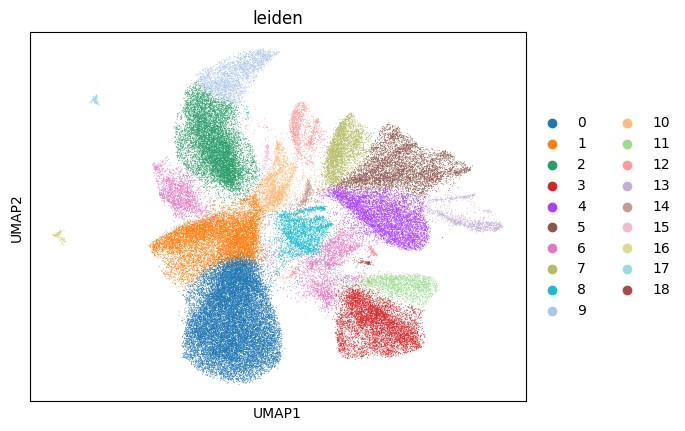

In [64]:
sc.tl.leiden(adata, resolution=0.5)

C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


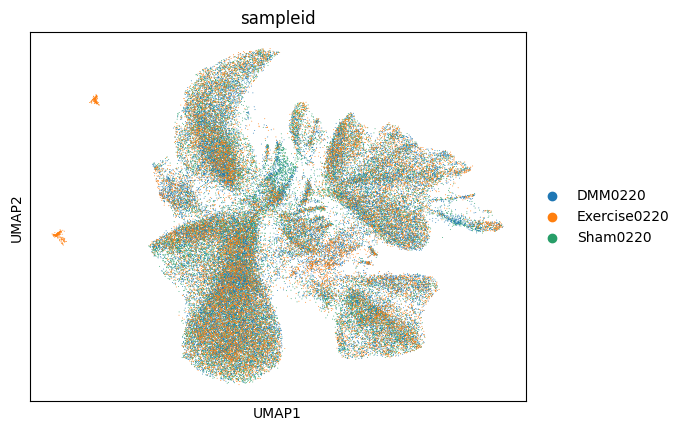

In [65]:
sc.pl.umap(adata, color=["sampleid"])

In [16]:
for res in [3.0, 4.0, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res
    )

C:\Users\Cristal\AppData\Local\Temp\ipykernel_1852\1791661462.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  col

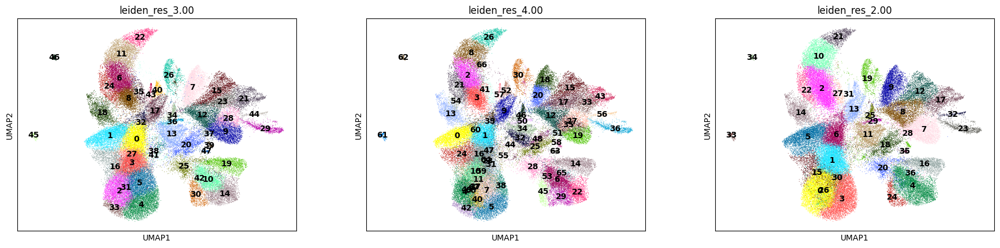

In [67]:
sc.pl.umap(
    adata,
    color=["leiden_res_3.00", "leiden_res_4.00", "leiden_res_2.00"],
    legend_loc="on data",
)

In [18]:
adata

AnnData object with n_obs × n_vars = 70230 × 10000
    obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'gender', 'genotype', 'region', 'age_at_collection', 'tissue', 'nuclei_enrichment', 'cohort', 'sampleid', '_scvi_batch', '_scvi_labels', 'leiden', 'barcode', 'leiden_res_3.00', 'leiden_res_4.00', 'leiden_res_2.00'
    var: 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'sampleid_colors', 'umap', 'leiden_res_3.00', 'leiden_res_4.00', 'leiden_res_2.00'
    obsm: 'X_scVI', 'X_umap'
    layers: 'hvgcounts'
    obsp: 'connectivities', 'distances'

In [ ]:

# Change clusters (this is independent of UMAP)
sc.tl.leiden(adata, resolution=2.0)

# Plot
sc.pl.umap(adata, color="leiden")


categories: 0, 1, 2, etc.
var_group_labels: Calca + Adra2a, Calca+Bmpr1b, Calca+Oprk1, etc.


C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\Cristal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed 

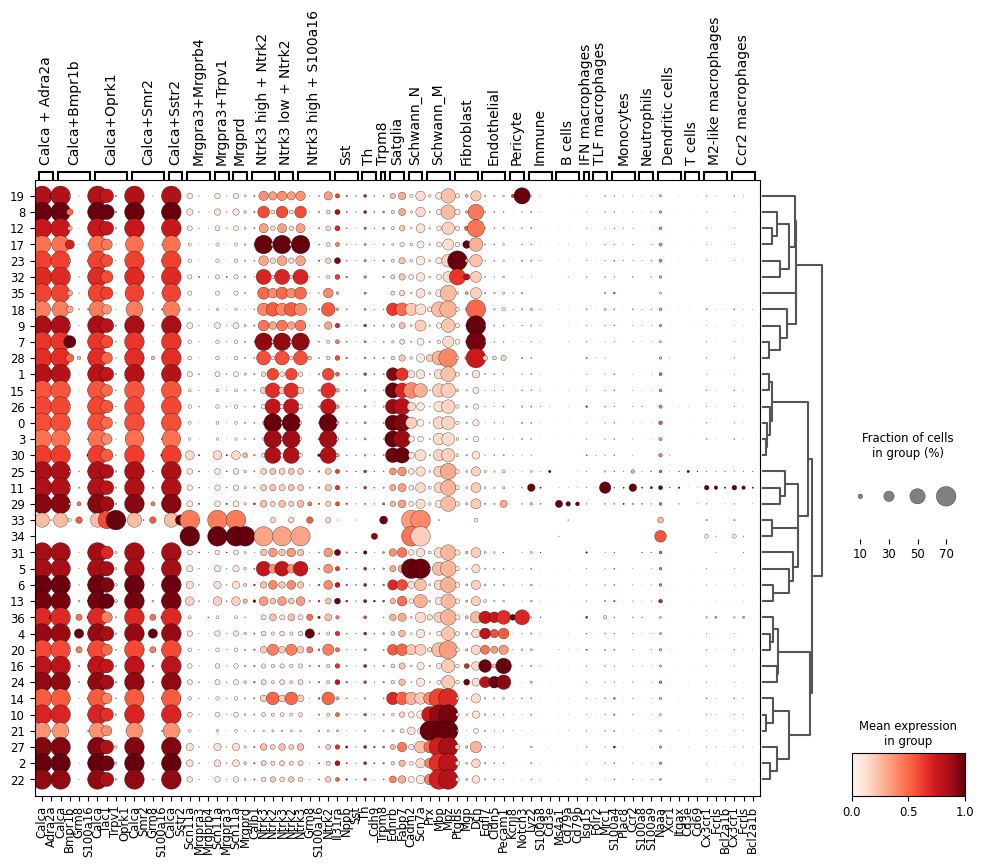

In [68]:
import pandas as pd
import scanpy as sc

# Step 1: Create gene list and order of subtypes for dot plot
marker_data = [
    ("Calca", "Calca + Adra2a"), ("Calca", "Calca+Bmpr1b"), ("Calca", "Calca+Oprk1"),
    ("Calca", "Calca+Smr2"), ("Tac1", "Calca+Oprk1"), ("Trpv1", "Calca+Oprk1"),
    ("Calca", "Calca+Sstr2"), ("Adra2a", "Calca + Adra2a"), ("Bmpr1b", "Calca+Bmpr1b"),
    ("Oprk1", "Calca+Oprk1"), ("Smr2", "Calca+Smr2"), ("Sstr2", "Calca+Sstr2"),
    ("Scn11a", "Mrgpra3+Mrgprb4"), ("Scn11a", "Mrgpra3+Trpv1"), ("Scn11a", "Mrgprd"),
    ("Mrgpra3", "Mrgpra3+Mrgprb4"), ("Mrgpra3", "Mrgpra3+Trpv1"), ("Mrgprb4", "Mrgpra3+Mrgprb4"),
    ("Mrgprd", "Mrgprd"), ("Calb1", "Ntrk3 high + Ntrk2"), ("Ntrk3", "Ntrk3 high + Ntrk2"),
    ("Ntrk3", "Ntrk3 low + Ntrk2"), ("Ntrk3", "Ntrk3 high + S100a16"), ("Grm8", "Calca+Bmpr1b"),
    ("Grm8", "Calca+Smr2"), ("Grm8", "Ntrk3 high + S100a16"), ("S100a16", "Calca+Bmpr1b"),
    ("S100a16", "Calca+Smr2"), ("S100a16", "Ntrk3 high + S100a16"), ("Ntrk2", "Ntrk3 high + S100a16"),
    ("Ntrk2", "Ntrk3 high + Ntrk2"), ("Ntrk2", "Ntrk3 low + Ntrk2"), ("Il31ra", "Sst"),
    ("Nppb", "Sst"), ("Sst", "Sst"), ("Th", "Th"), ("Cdh9", "Th"),
    ("Trpm8", "Trpm8"), ("Ednrb", "Satglia"), ("Fabp7", "Satglia"), ("Cadm2", "Schwann_N"),
    ("Scn7a", "Schwann_N"), ("Prx", "Schwann_M"), ("Mbp", "Schwann_M"), ("Mpz", "Schwann_M"),
    ("Ptgds", "Fibroblast"), ("Mgp", "Fibroblast"), ("Dcn", "Fibroblast"),
    ("Egfl7", "Endothelial"), ("Cldn5", "Endothelial"), ("Pecam1", "Endothelial"),
    ("Kcnj8", "Pericyte"), ("Notch3", "Pericyte"), ("Lyz2", "Immune"), ("S100a8", "Immune"),
    ("Cd3e", "Immune"), ("Ms4a1", "B cells"), ("Cd79a", "B cells"), ("Cd79b", "B cells"),
    ("Isg15", "IFN macrophages"), ("Folr2", "TLF macrophages"), ("Mrc1", "TLF macrophages"),
    ("S100a4", "Monocytes"), ("Plac8", "Monocytes"), ("Ccr2", "Monocytes"),
    ("S100a8", "Neutrophils"), ("S100a9", "Neutrophils"), ("Naaa", "Dendritic cells"),
    ("Xcr1", "Dendritic cells"), ("Itgax", "Dendritic cells"), ("Cd3e", "T cells"),
    ("Cd69", "T cells"), ("Cx3cr1", "M2-like macrophages"), ("Fcrls", "M2-like macrophages"),
    ("Bcl2a1b", "M2-like macrophages"), ("Cx3cr1", "Ccr2 macrophages"), ("Fcrls", "Ccr2 macrophages"),
    ("Bcl2a1b", "Ccr2 macrophages")
]

# Step 2: Convert to DataFrame for easy grouping
marker_df = pd.DataFrame(marker_data, columns=["gene", "subtype"])

# Step 3: Pivot gene list into format suitable for Scanpy dotplot
# Create a sorted list of unique subtypes in desired order
subtype_order = marker_df["subtype"].unique().tolist()

# Create nested gene list by subtype
grouped_genes = marker_df.groupby("subtype")["gene"].unique().reindex(subtype_order)

# Step 4: Generate the dot plot
sc.pl.dotplot(
    adata,
    var_names=grouped_genes.to_dict(),
    groupby="leiden_res_2.00",  # or "cell_type" if already renamed
    standard_scale="var",  # normalize per gene for clearer visualization
    dendrogram=True,
    dot_max=0.7,
    figsize=(12, 8),
    save="_markers.png"
)


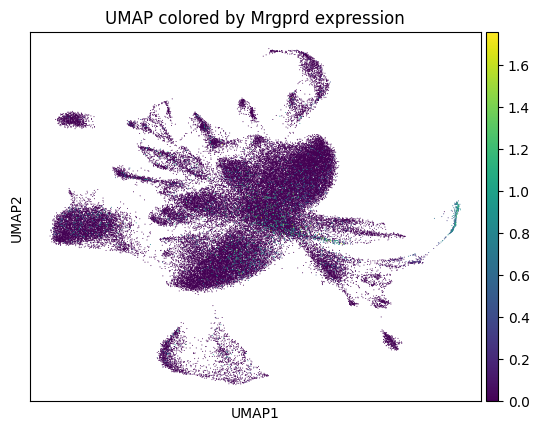

In [38]:
import matplotlib.pyplot as plt

gene = "Mrgprd"
sc.pl.umap(adata, color=gene, show=False)
plt.title(f"UMAP colored by {gene} expression")
plt.savefig(f"umap_{gene}.png", dpi=300)


In [20]:
# 1. Compute neighbors using scVI latent space
sc.pp.neighbors(adata, use_rep='X_scVI')

In [22]:
# 2. Recompute UMAP with custom spacing
sc.tl.umap(adata, min_dist=0.01, spread=3.0)

In [24]:
# 3. Cluster with a custom resolution
sc.tl.leiden(adata, resolution=2.0)

In [26]:
# 4. Save scVI-based UMAP and clustering separately
adata.obsm["X_umap_scVI_custom"] = adata.obsm["X_umap"].copy()
adata.obs["leiden_scVI_res2"] = adata.obs["leiden"].copy()

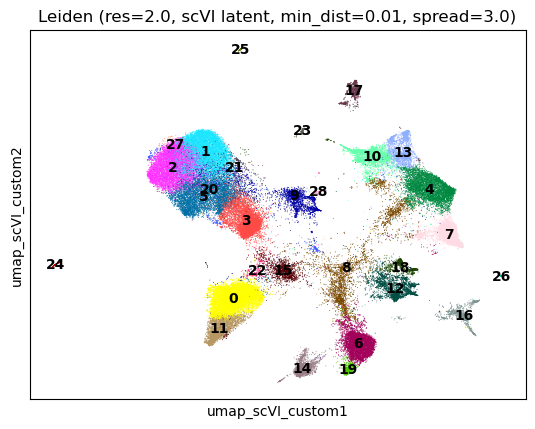

In [28]:
# 5. Plot the custom UMAP using the saved keys
sc.pl.embedding(
    adata,
    basis="umap_scVI_custom",
    color="leiden_scVI_res2",
    title="Leiden (res=2.0, scVI latent, min_dist=0.01, spread=3.0)",
    legend_loc='on data'
)

D:\Sublime Text 3\anaconda\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
D:\Sublime Text 3\anaconda\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
D:\Sublime Text 3\anaconda\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:440: PerformanceWarning: DataFrame is highly fragmented.  This is usu

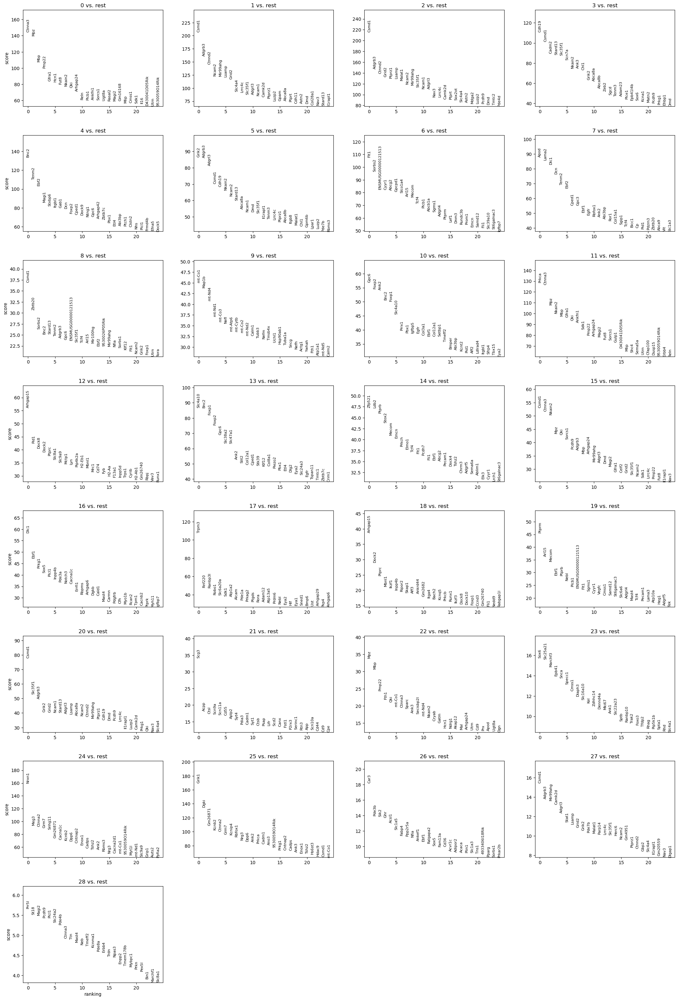

In [34]:
sc.tl.rank_genes_groups(adata, "leiden_scVI_res2", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [38]:
# Convert the results into a pandas DataFrame
df = sc.get.rank_genes_groups_df(adata, group=None)

# Save the DataFrame to a CSV file
df.to_csv("rank_genes_groups_results.csv", index=False)

Top 3 genes: ['Ctnna3' 'Mpz' 'Mbp']


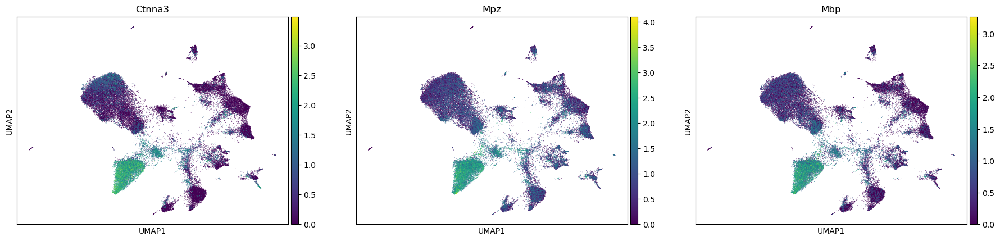

In [40]:
# 2. Extract top 3 genes across all clusters
top_genes_df = sc.get.rank_genes_groups_df(adata, group=None)
top3_genes = top_genes_df['names'].unique()[:3]  # Get first 3 unique gene names

print("Top 3 genes:", top3_genes)

# 3. Plot feature plots for those genes
sc.pl.umap(adata, color=top3_genes, gene_symbols=None)

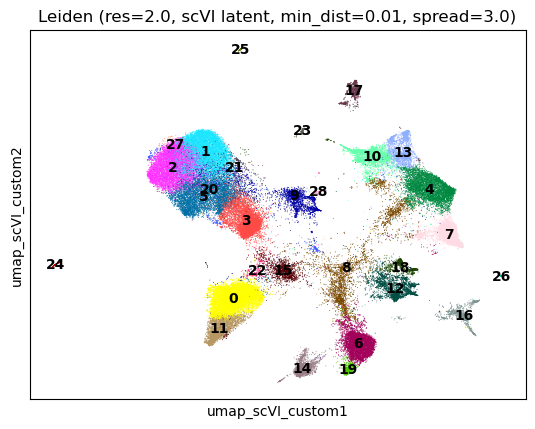

In [46]:
# 5. Plot the custom UMAP using the saved keys
sc.pl.embedding(
    adata,
    basis="umap_scVI_custom",
    color="leiden_scVI_res2",
    title="Leiden (res=2.0, scVI latent, min_dist=0.01, spread=3.0)",
    legend_loc='on data'
)

D:\Sublime Text 3\anaconda\Lib\site-packages\scanpy\tools\_utils.py:41: UserWarning: You’re trying to run this on 10000 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


categories: 0, 1, 2, etc.
var_group_labels: Calca + Adra2a, Calca+Bmpr1b, Calca+Oprk1, etc.


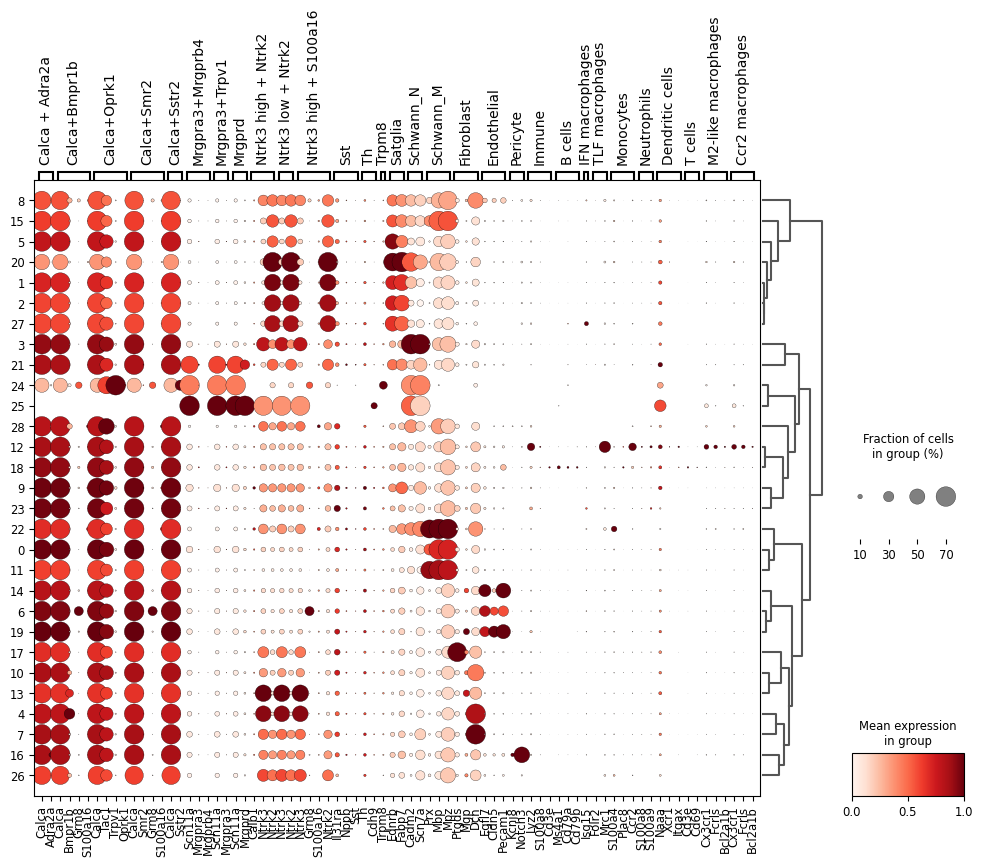

In [32]:
import pandas as pd
import scanpy as sc

# Step 1: Create gene list and order of subtypes for dot plot
marker_data = [
    ("Calca", "Calca + Adra2a"), ("Calca", "Calca+Bmpr1b"), ("Calca", "Calca+Oprk1"),
    ("Calca", "Calca+Smr2"), ("Tac1", "Calca+Oprk1"), ("Trpv1", "Calca+Oprk1"),
    ("Calca", "Calca+Sstr2"), ("Adra2a", "Calca + Adra2a"), ("Bmpr1b", "Calca+Bmpr1b"),
    ("Oprk1", "Calca+Oprk1"), ("Smr2", "Calca+Smr2"), ("Sstr2", "Calca+Sstr2"),
    ("Scn11a", "Mrgpra3+Mrgprb4"), ("Scn11a", "Mrgpra3+Trpv1"), ("Scn11a", "Mrgprd"),
    ("Mrgpra3", "Mrgpra3+Mrgprb4"), ("Mrgpra3", "Mrgpra3+Trpv1"), ("Mrgprb4", "Mrgpra3+Mrgprb4"),
    ("Mrgprd", "Mrgprd"), ("Calb1", "Ntrk3 high + Ntrk2"), ("Ntrk3", "Ntrk3 high + Ntrk2"),
    ("Ntrk3", "Ntrk3 low + Ntrk2"), ("Ntrk3", "Ntrk3 high + S100a16"), ("Grm8", "Calca+Bmpr1b"),
    ("Grm8", "Calca+Smr2"), ("Grm8", "Ntrk3 high + S100a16"), ("S100a16", "Calca+Bmpr1b"),
    ("S100a16", "Calca+Smr2"), ("S100a16", "Ntrk3 high + S100a16"), ("Ntrk2", "Ntrk3 high + S100a16"),
    ("Ntrk2", "Ntrk3 high + Ntrk2"), ("Ntrk2", "Ntrk3 low + Ntrk2"), ("Il31ra", "Sst"),
    ("Nppb", "Sst"), ("Sst", "Sst"), ("Th", "Th"), ("Cdh9", "Th"),
    ("Trpm8", "Trpm8"), ("Ednrb", "Satglia"), ("Fabp7", "Satglia"), ("Cadm2", "Schwann_N"),
    ("Scn7a", "Schwann_N"), ("Prx", "Schwann_M"), ("Mbp", "Schwann_M"), ("Mpz", "Schwann_M"),
    ("Ptgds", "Fibroblast"), ("Mgp", "Fibroblast"), ("Dcn", "Fibroblast"),
    ("Egfl7", "Endothelial"), ("Cldn5", "Endothelial"), ("Pecam1", "Endothelial"),
    ("Kcnj8", "Pericyte"), ("Notch3", "Pericyte"), ("Lyz2", "Immune"), ("S100a8", "Immune"),
    ("Cd3e", "Immune"), ("Ms4a1", "B cells"), ("Cd79a", "B cells"), ("Cd79b", "B cells"),
    ("Isg15", "IFN macrophages"), ("Folr2", "TLF macrophages"), ("Mrc1", "TLF macrophages"),
    ("S100a4", "Monocytes"), ("Plac8", "Monocytes"), ("Ccr2", "Monocytes"),
    ("S100a8", "Neutrophils"), ("S100a9", "Neutrophils"), ("Naaa", "Dendritic cells"),
    ("Xcr1", "Dendritic cells"), ("Itgax", "Dendritic cells"), ("Cd3e", "T cells"),
    ("Cd69", "T cells"), ("Cx3cr1", "M2-like macrophages"), ("Fcrls", "M2-like macrophages"),
    ("Bcl2a1b", "M2-like macrophages"), ("Cx3cr1", "Ccr2 macrophages"), ("Fcrls", "Ccr2 macrophages"),
    ("Bcl2a1b", "Ccr2 macrophages")
]

# Step 2: Convert to DataFrame for easy grouping
marker_df = pd.DataFrame(marker_data, columns=["gene", "subtype"])

# Step 3: Pivot gene list into format suitable for Scanpy dotplot
# Create a sorted list of unique subtypes in desired order
subtype_order = marker_df["subtype"].unique().tolist()

# Create nested gene list by subtype
grouped_genes = marker_df.groupby("subtype")["gene"].unique().reindex(subtype_order)

# Step 4: Generate the dot plot
sc.pl.dotplot(
    adata,
    var_names=grouped_genes.to_dict(),
    groupby="leiden_scVI_res2",  # or "cell_type" if already renamed
    standard_scale="var",  # normalize per gene for clearer visualization
    dendrogram=True,
    dot_max=0.7,
    figsize=(12, 8),
    save="_markers.png"
)

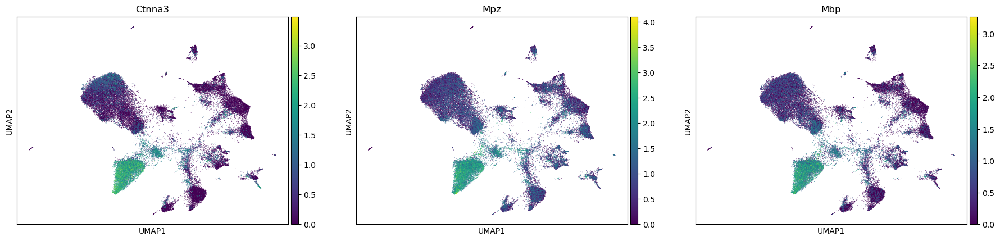

In [44]:
top3_genes_cluster0 = sc.get.rank_genes_groups_df(adata, group="0")['names'].head(3).tolist()
sc.pl.umap(adata, color=top3_genes_cluster0)


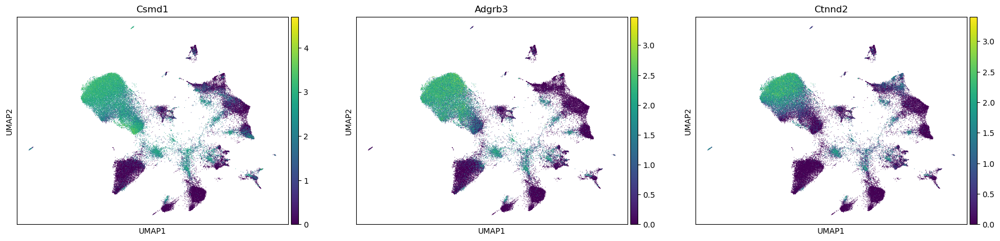

In [48]:
top3_genes_cluster1 = sc.get.rank_genes_groups_df(adata, group="1")['names'].head(3).tolist()
sc.pl.umap(adata, color=top3_genes_cluster1)

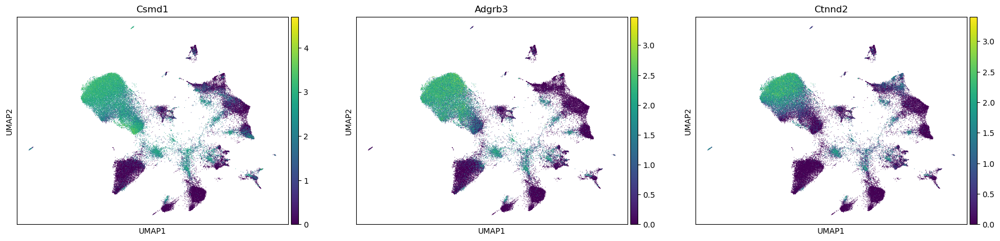

In [50]:
top3_genes_cluster2 = sc.get.rank_genes_groups_df(adata, group="2")['names'].head(3).tolist()
sc.pl.umap(adata, color=top3_genes_cluster2)

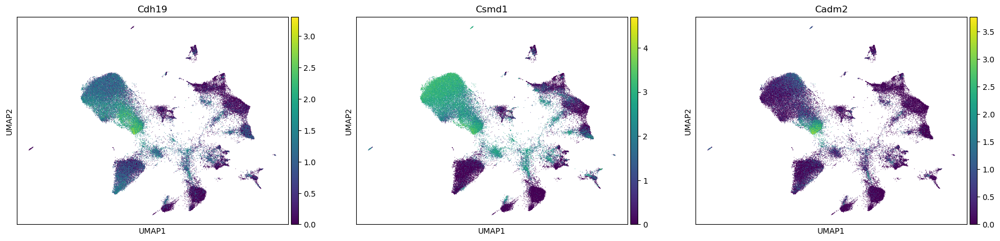

In [42]:
top3_genes_cluster3 = sc.get.rank_genes_groups_df(adata, group="3")['names'].head(3).tolist()
sc.pl.umap(adata, color=top3_genes_cluster3)


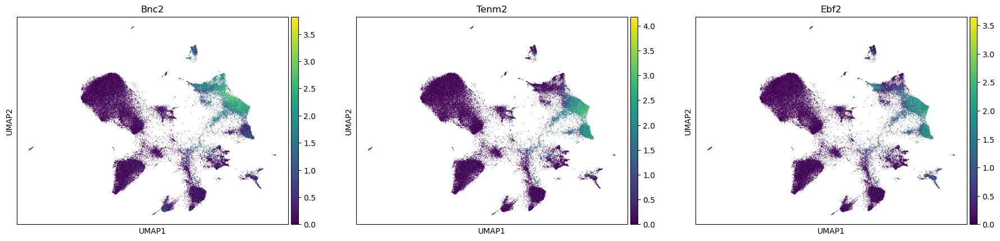

In [52]:
top3_genes_cluster4 = sc.get.rank_genes_groups_df(adata, group="4")['names'].head(3).tolist()
sc.pl.umap(adata, color=top3_genes_cluster4)

In [54]:
# Optional: Save the updated AnnData object
adata.write("dmm_updated.h5ad")

In [56]:
# Step 1: Load the .h5ad file
adata = sc.read_h5ad("D:/Baylor/DRG/scvi_integration/aclt_no_exercise/drg.h5ad")

In [58]:
adata

AnnData object with n_obs × n_vars = 49537 × 10000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'gender', 'genotype', 'region', 'age_at_collection', 'condition', 'sampleid', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'sampleid_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'hvgcounts'
    obsp: 'connectivities', 'distances'

In [60]:
# Step 2: Load the new .obs (cell metadata)
new_obs = pd.read_csv("D:/Baylor/DRG/scvi_integration/aclt_no_exercise/drg_obs.txt.gz", sep="\t", index_col=0)

In [62]:
# Step 3: Load the new .var (gene metadata)
new_var = pd.read_csv("D:/Baylor/DRG/scvi_integration/aclt_no_exercise/drg_var.txt.gz", sep="\t", index_col=0)

In [64]:
# Step 4: Make sure the dimensions match
assert new_obs.shape[0] == adata.n_obs, "Mismatch in number of cells (obs)"
assert new_var.shape[0] == adata.n_vars, "Mismatch in number of genes (var)"

In [66]:
# Step 5: Replace obs and var
adata.obs = new_obs
adata.var = new_var

D:\Sublime Text 3\anaconda\Lib\site-packages\anndata\_core\anndata.py:767: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 0, 0, 0, 0]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
D:\Sublime Text 3\anaconda\Lib\site-packages\anndata\_core\anndata.py:767: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [True, True, True, True, True]

    Inferred to be: boolean

  value_idx = self._prep_dim_index(value.index, attr)


In [68]:
# Print overview
print(adata)
print(adata.obs.head())
print(adata.var.head())


AnnData object with n_obs × n_vars = 49537 × 10000
    obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'gender', 'genotype', 'region', 'age_at_collection', 'condition', 'sampleid', '_scvi_batch', '_scvi_labels', 'leiden', 'barcode'
    var: 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'sampleid_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'hvgcounts'
    obsp: 'connectivities', 'distances'
            nCount_RNA  nFeature_RNA  percent.mt      pANN DF.classifications  \
orig.ident                                                                      
0               1559.0          1062    0.705581  0.136213            Singlet   
0               2562.0          1425    0.000000  0.086379            Singlet   
0               1016.0           751    2.460630  0.225914            S

In [70]:
# 1. Compute neighbors using scVI latent space
sc.pp.neighbors(adata, use_rep='X_scVI')

In [84]:
# 2. Recompute UMAP with custom spacing
sc.tl.umap(adata, min_dist=0.01, spread=3.0)

In [ ]:
# 3. Cluster with a custom resolution
sc.tl.leiden(adata, resolution=3.0)

In [86]:
# 4. Save scVI-based UMAP and clustering separately
adata.obsm["X_umap_scVI_custom"] = adata.obsm["X_umap"].copy()
adata.obs["leiden_scVI_res3.0"] = adata.obs["leiden"].copy()

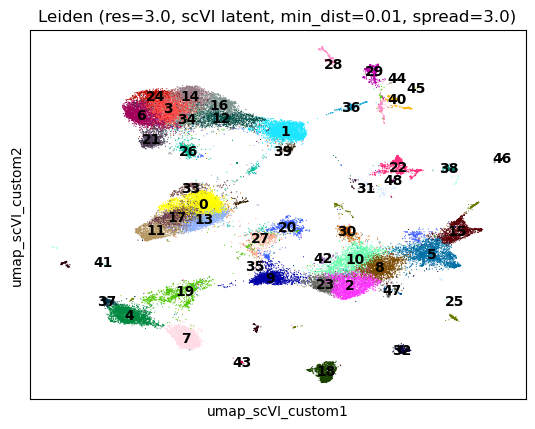

In [108]:
# 5. Plot the custom UMAP using the saved keys
sc.pl.embedding(
    adata,
    basis="umap_scVI_custom",
    color="leiden_scVI_res3.0",
    title="Leiden (res=3.0, scVI latent, min_dist=0.01, spread=3.0)",
    legend_loc='on data'
)

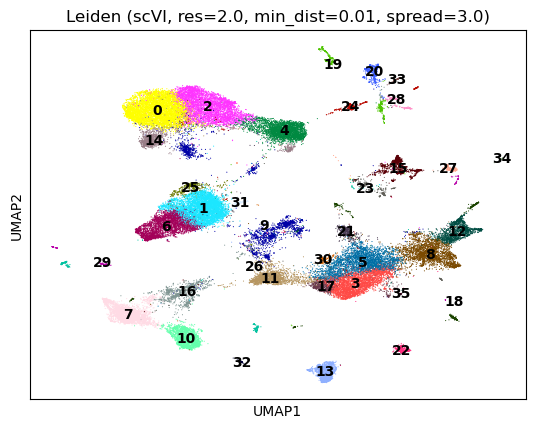

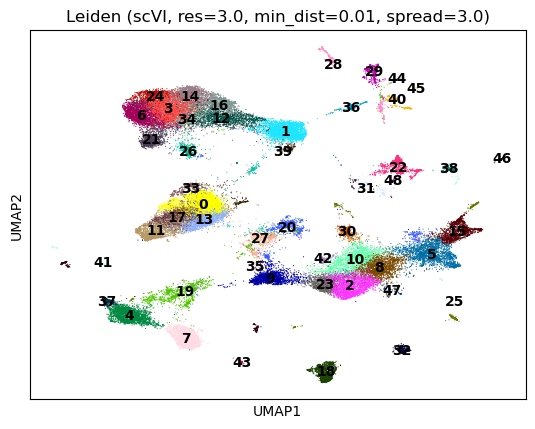

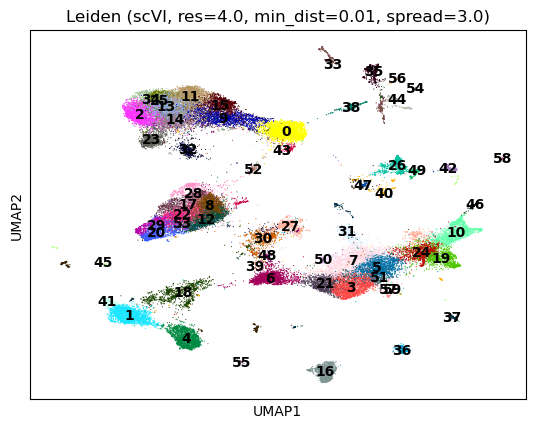

In [94]:
import scanpy as sc

# Step 1: Compute neighbors once on scVI latent space
sc.pp.neighbors(adata, use_rep='X_scVI')

# Step 2: Recompute UMAP with tight and spaced layout
sc.tl.umap(adata, min_dist=0.01, spread=3.0)

# Step 3: Loop through multiple resolutions and save results
resolutions = [2.0, 3.0, 4.0]

for res in resolutions:
    leiden_key = f"leiden_scVI_res{res}"
    
    # Cluster with custom resolution
    sc.tl.leiden(adata, resolution=res, key_added=leiden_key)
    
    # Plot UMAP with new cluster labels
    sc.pl.umap(
        adata,
        color=leiden_key,
        title=f"Leiden (scVI, res={res}, min_dist=0.01, spread=3.0)",
        legend_loc='on data',
        save=f"_scVI_res{res}.png"  # saves figure to file
    )


In [100]:
adata.obs["leiden_scVI_res3.0"] = adata.obs["leiden_scVI_res3.0"].astype("category")

D:\Sublime Text 3\anaconda\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
D:\Sublime Text 3\anaconda\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
D:\Sublime Text 3\anaconda\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:440: PerformanceWarning: DataFrame is highly fragmented.  This is usu

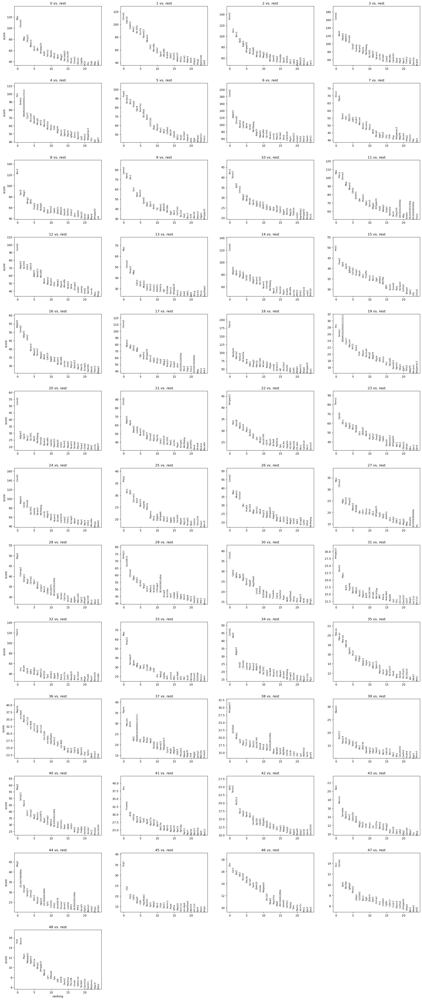

In [102]:
sc.tl.rank_genes_groups(adata, "leiden_scVI_res3.0", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [104]:
# Convert the results into a pandas DataFrame
df = sc.get.rank_genes_groups_df(adata, group=None)

# Save the DataFrame to a CSV file
df.to_csv("rank_genes_groups_resultsres3.csv", index=False)

D:\Sublime Text 3\anaconda\Lib\site-packages\scanpy\tools\_utils.py:41: UserWarning: You’re trying to run this on 10000 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


categories: 0, 1, 2, etc.
var_group_labels: Calca + Adra2a, Calca+Bmpr1b, Calca+Oprk1, etc.


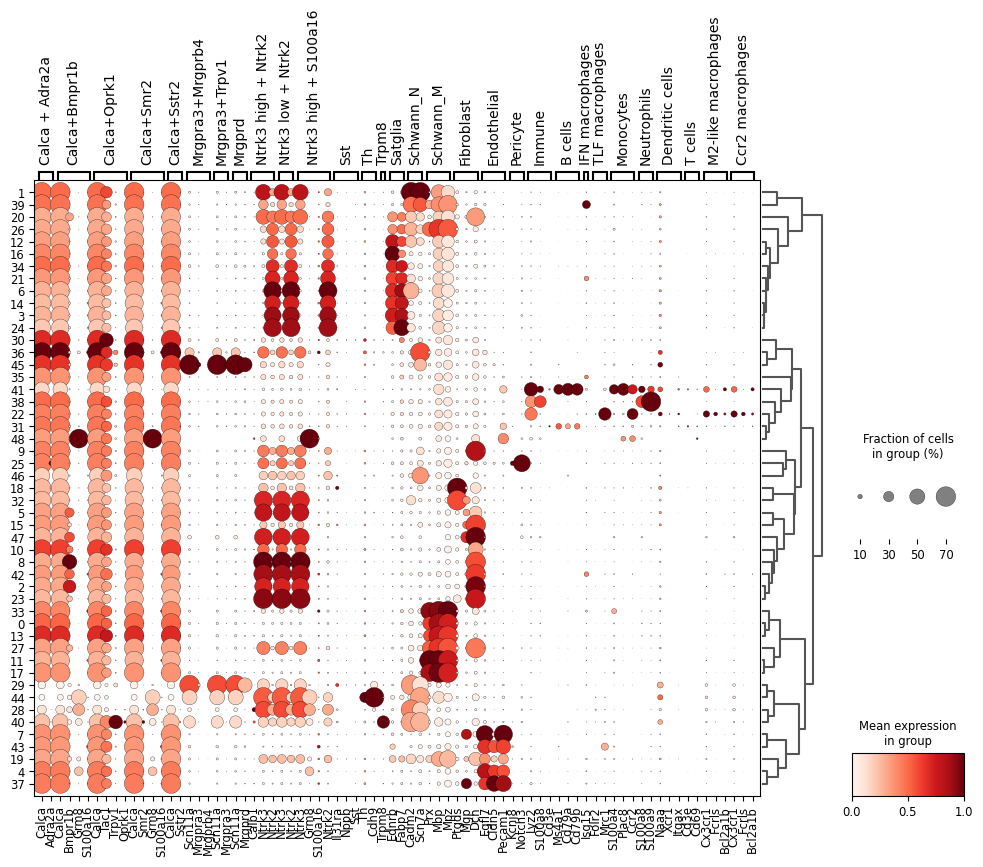

In [106]:
import pandas as pd
import scanpy as sc

# Step 1: Create gene list and order of subtypes for dot plot
marker_data = [
    ("Calca", "Calca + Adra2a"), ("Calca", "Calca+Bmpr1b"), ("Calca", "Calca+Oprk1"),
    ("Calca", "Calca+Smr2"), ("Tac1", "Calca+Oprk1"), ("Trpv1", "Calca+Oprk1"),
    ("Calca", "Calca+Sstr2"), ("Adra2a", "Calca + Adra2a"), ("Bmpr1b", "Calca+Bmpr1b"),
    ("Oprk1", "Calca+Oprk1"), ("Smr2", "Calca+Smr2"), ("Sstr2", "Calca+Sstr2"),
    ("Scn11a", "Mrgpra3+Mrgprb4"), ("Scn11a", "Mrgpra3+Trpv1"), ("Scn11a", "Mrgprd"),
    ("Mrgpra3", "Mrgpra3+Mrgprb4"), ("Mrgpra3", "Mrgpra3+Trpv1"), ("Mrgprb4", "Mrgpra3+Mrgprb4"),
    ("Mrgprd", "Mrgprd"), ("Calb1", "Ntrk3 high + Ntrk2"), ("Ntrk3", "Ntrk3 high + Ntrk2"),
    ("Ntrk3", "Ntrk3 low + Ntrk2"), ("Ntrk3", "Ntrk3 high + S100a16"), ("Grm8", "Calca+Bmpr1b"),
    ("Grm8", "Calca+Smr2"), ("Grm8", "Ntrk3 high + S100a16"), ("S100a16", "Calca+Bmpr1b"),
    ("S100a16", "Calca+Smr2"), ("S100a16", "Ntrk3 high + S100a16"), ("Ntrk2", "Ntrk3 high + S100a16"),
    ("Ntrk2", "Ntrk3 high + Ntrk2"), ("Ntrk2", "Ntrk3 low + Ntrk2"), ("Il31ra", "Sst"),
    ("Nppb", "Sst"), ("Sst", "Sst"), ("Th", "Th"), ("Cdh9", "Th"),
    ("Trpm8", "Trpm8"), ("Ednrb", "Satglia"), ("Fabp7", "Satglia"), ("Cadm2", "Schwann_N"),
    ("Scn7a", "Schwann_N"), ("Prx", "Schwann_M"), ("Mbp", "Schwann_M"), ("Mpz", "Schwann_M"),
    ("Ptgds", "Fibroblast"), ("Mgp", "Fibroblast"), ("Dcn", "Fibroblast"),
    ("Egfl7", "Endothelial"), ("Cldn5", "Endothelial"), ("Pecam1", "Endothelial"),
    ("Kcnj8", "Pericyte"), ("Notch3", "Pericyte"), ("Lyz2", "Immune"), ("S100a8", "Immune"),
    ("Cd3e", "Immune"), ("Ms4a1", "B cells"), ("Cd79a", "B cells"), ("Cd79b", "B cells"),
    ("Isg15", "IFN macrophages"), ("Folr2", "TLF macrophages"), ("Mrc1", "TLF macrophages"),
    ("S100a4", "Monocytes"), ("Plac8", "Monocytes"), ("Ccr2", "Monocytes"),
    ("S100a8", "Neutrophils"), ("S100a9", "Neutrophils"), ("Naaa", "Dendritic cells"),
    ("Xcr1", "Dendritic cells"), ("Itgax", "Dendritic cells"), ("Cd3e", "T cells"),
    ("Cd69", "T cells"), ("Cx3cr1", "M2-like macrophages"), ("Fcrls", "M2-like macrophages"),
    ("Bcl2a1b", "M2-like macrophages"), ("Cx3cr1", "Ccr2 macrophages"), ("Fcrls", "Ccr2 macrophages"),
    ("Bcl2a1b", "Ccr2 macrophages")
]

# Step 2: Convert to DataFrame for easy grouping
marker_df = pd.DataFrame(marker_data, columns=["gene", "subtype"])

# Step 3: Pivot gene list into format suitable for Scanpy dotplot
# Create a sorted list of unique subtypes in desired order
subtype_order = marker_df["subtype"].unique().tolist()

# Create nested gene list by subtype
grouped_genes = marker_df.groupby("subtype")["gene"].unique().reindex(subtype_order)

# Step 4: Generate the dot plot
sc.pl.dotplot(
    adata,
    var_names=grouped_genes.to_dict(),
    groupby="leiden_scVI_res3.0",  # or "cell_type" if already renamed
    standard_scale="var",  # normalize per gene for clearer visualization
    dendrogram=True,
    dot_max=0.7,
    figsize=(12, 8),
    save="_markers.png"
)

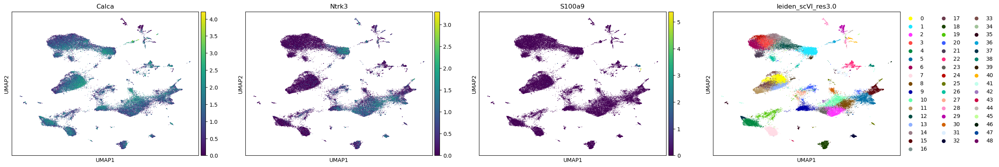

In [116]:
sc.pl.umap(adata, color=[ "Calca", "Ntrk3", "S100a9", "leiden_scVI_res3.0"])

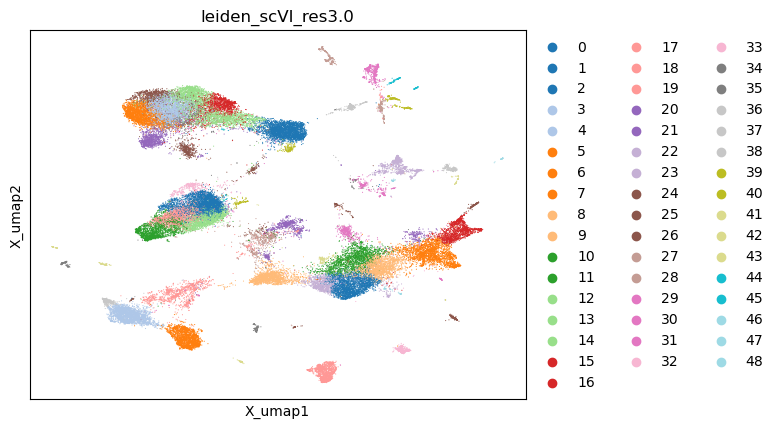

In [135]:
##### umap
sc.pl.embedding(adata, basis="X_umap", color=["leiden_scVI_res3.0"], ncols=1, palette="tab20")

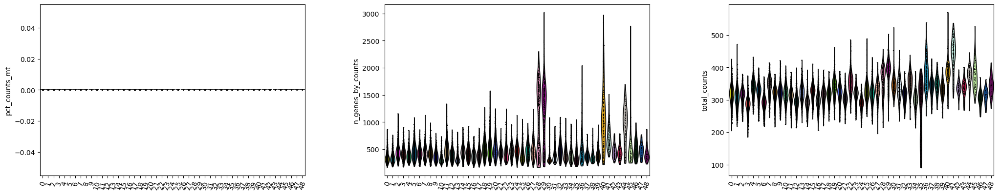

In [50]:
#####qc plot
# Flag mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("Mt-")

# Compute QC metrics
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt-"],
    percent_top=None,
    log1p=False,
    inplace=True
)

# Violin plot by cluster
sc.pl.violin(
    adata,
    keys=["pct_counts_mt", "n_genes_by_counts", "total_counts"],
    groupby="leiden_scVI_res3.0",
    rotation=75,
    multi_panel=True
)



In [141]:
adata.var

,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,symbol
highly_variable,,,,,,
True,0.219286,0.786067,1.262223,3,True,Xkr4
True,0.021249,0.283508,0.419160,3,True,Gm1992
True,0.001202,0.187390,0.308321,2,False,Gm37381
True,0.013633,0.403764,0.697488,3,True,Rp1
True,0.026936,0.527651,0.957286,3,True,Sox17
...,...,...,...,...,...,...
True,0.006831,0.234544,0.359669,2,False,mt-Nd6
True,0.273941,1.123094,1.574917,3,True,mt-Cytb
True,0.000164,0.277015,0.547408,2,False,ENSMUSG00000079800


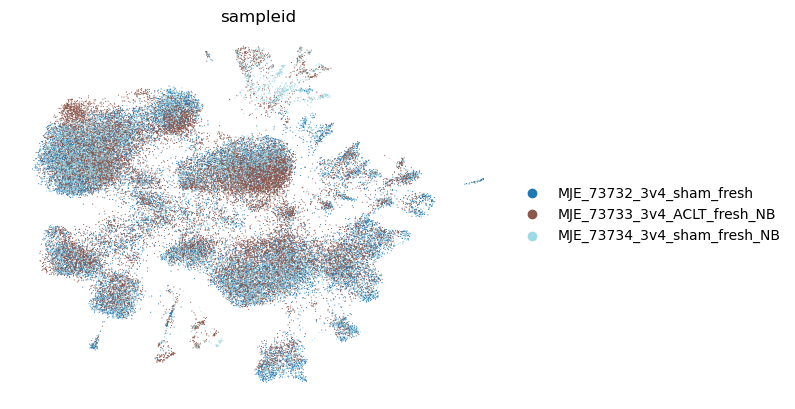

In [54]:
##### umap

sc.pl.embedding(adata, basis="X_umap", color=["sampleid"], ncols=1,frameon=False,save="_umapsampleid.png", palette="tab20")

In [ ]:


#####qc plot

adata_query.var["mt"] = adata_query.var_names.str.startswith("mt-")

sc.pp.calculate_qc_metrics(

    adata_query, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True

)

 

sc.pl.violin(adata_query,keys=["pct_counts_mt","n_genes_by_counts", "total_counts"], groupby="leiden", rotation=75, save=f"_{bname}_QC.png", multi_panel=True)

In [149]:
!pip install --upgrade scvi-tools


  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
INFO: pip is looking at multiple versions of flax to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of orbax-checkpoint to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of orbax-checkpoint to determine which version is compatible with other requirements. This could take a while.
   ---------------------------------------- 0.0/503.2 kB ? eta -:--:--
   -------------- ------------------------- 184.3/503.2 kB 3.7 MB/s eta 0:00:01
   -------------------------------- ------- 409.6/503.2 kB 4.2 MB/s eta 0:00:01
   ---------------------------------------- 503.2/503.2 kB 4.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/144.5 kB ? eta -:--:--
   ---------------------------------------- 144.5/144.5 kB 4.3 

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
streamlit 1.32.0 requires packaging<24,>=16.8, but you have packaging 24.2 which is incompatible.


In [157]:
!pip install scvi-tools


  Using cached packaging-25.0-py3-none-any.whl.metadata (3.3 kB)
  Using cached packaging-24.2-py3-none-any.whl.metadata (3.2 kB)
Using cached packaging-24.2-py3-none-any.whl (65 kB)
  Attempting uninstall: packaging
    Found existing installation: packaging 23.2
    Uninstalling packaging-23.2:
      Successfully uninstalled packaging-23.2


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
streamlit 1.32.0 requires packaging<24,>=16.8, but you have packaging 24.2 which is incompatible.


In [169]:
!pip install --upgrade streamlit

   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB 640.0 kB/s eta 0:00:16
   ---------------------------------------- 0.1/9.9 MB 1.4 MB/s eta 0:00:07
   - -------------------------------------- 0.3/9.9 MB 2.0 MB/s eta 0:00:05
   -- ------------------------------------- 0.5/9.9 MB 2.9 MB/s eta 0:00:04
   -- ------------------------------------- 0.6/9.9 MB 2.9 MB/s eta 0:00:04
   -- ------------------------------------- 0.7/9.9 MB 3.0 MB/s eta 0:00:04
   --- ------------------------------------ 0.8/9.9 MB 2.5 MB/s eta 0:00:04
   --- ------------------------------------ 0.9/9.9 MB 2.5 MB/s eta 0:00:04
   ---- ----------------------------------- 1.1/9.9 MB 2.7 MB/s eta 0:00:04
   ----- ---------------------------------- 1.3/9.9 MB 2.9 MB/s eta 0:00:04
   ----- ---------------------------------- 1.5/9.9 MB 2.9 MB/s eta 0:00:03
   ------ --------------------------------- 1.6/9.9 MB 3.1 MB/s eta 0:00:03
   ------- ------

In [171]:
!pip install packaging==24.2 --force-reinstall

  Using cached packaging-24.2-py3-none-any.whl.metadata (3.2 kB)
Using cached packaging-24.2-py3-none-any.whl (65 kB)
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2


In [177]:
pip install -U scvi-tools

Note: you may need to restart the kernel to use updated packages.


In [1]:
import scvi
print("scvi-tools version:", scvi.__version__)


scvi-tools version: 1.3.0


D:\Sublime Text 3\anaconda\Lib\site-packages\docrep\decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
D:\Sublime Text 3\anaconda\Lib\site-packages\docrep\decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [3]:
import scanpy as sc
print("scanpy version:", sc.__version__)

scanpy version: 1.11.1


In [9]:
pip install --upgrade scanpy


   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.1 MB 640.0 kB/s eta 0:00:04
   - -------------------------------------- 0.1/2.1 MB 1.1 MB/s eta 0:00:02
   ----- ---------------------------------- 0.3/2.1 MB 2.4 MB/s eta 0:00:01
   --------- ------------------------------ 0.5/2.1 MB 3.3 MB/s eta 0:00:01
   ----------------- ---------------------- 0.9/2.1 MB 4.1 MB/s eta 0:00:01
   ------------------------ --------------- 1.3/2.1 MB 5.0 MB/s eta 0:00:01
   ------------------------------- -------- 1.6/2.1 MB 5.5 MB/s eta 0:00:01
   -------------------------------------- - 2.0/2.1 MB 5.9 MB/s eta 0:00:01
   ---------------------------------------- 2.1/2.1 MB 5.8 MB/s eta 0:00:00
  Attempting uninstall: scanpy
    Found existing installation: scanpy 1.10.2
    Uninstalling scanpy-1.10.2:
      Successfully uninstalled scanpy-1.10.2
Note: you may need to restart the kernel to use updated packages.


In [5]:
import scanpy as sc
import scvi

In [7]:
# Step 1: Load the .h5ad file
adata = sc.read_h5ad("D:/Baylor/DRG/scvi_integration/aclt_no_exercise/aclt_no_exercise_updated.h5ad")

D:\Sublime Text 3\anaconda\Lib\site-packages\anndata\_core\aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
D:\Sublime Text 3\anaconda\Lib\site-packages\anndata\_core\aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
D:\Sublime Text 3\anaconda\Lib\site-packages\anndata\_core\anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
D:\Sublime Text 3\anaconda\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [9]:
adata

AnnData object with n_obs × n_vars = 49537 × 10000
    obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'gender', 'genotype', 'region', 'age_at_collection', 'condition', 'sampleid', '_scvi_batch', '_scvi_labels', 'leiden', 'barcode', 'leiden_scVI_res2', 'leiden_scVI_res3', 'leiden_scVI_res2.0', 'leiden_scVI_res3.0', 'leiden_scVI_res4.0'
    var: 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_leiden_scVI_res3.0', 'hvg', 'leiden', 'leiden_colors', 'leiden_scVI_res2.0', 'leiden_scVI_res2.0_colors', 'leiden_scVI_res3.0', 'leiden_scVI_res3.0_colors', 'leiden_scVI_res4.0', 'leiden_scVI_res4.0_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sampleid_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap', 'X_umap_scVI_custom'
    varm: 'PCs'
    layers: 'hvgcounts'
    obsp: 'connectivities', 'distances'

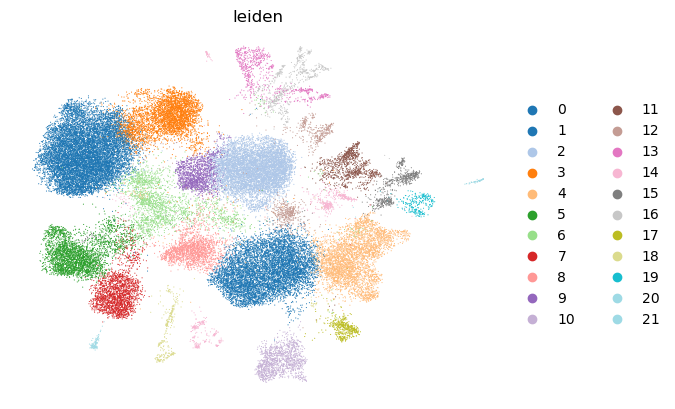

In [38]:
res = 1

# 1. Compute neighbors from scVI latent space
sc.pp.neighbors(adata, use_rep="X_scVI")

# 2. Run Leiden clustering (only `resolution` goes here)
sc.tl.leiden(adata, resolution=res)

# 3. Run UMAP with custom parameters
sc.tl.umap(adata)
##### umap
sc.pl.embedding(adata, basis="X_umap", color=["leiden"], ncols=1,frameon=False, palette="tab20")

In [27]:
res = 1

# 1. Compute neighbors from scVI latent space
sc.pp.neighbors(adata, use_rep="X_scVI")

# 2. Run Leiden clustering (only `resolution` goes here)
sc.tl.leiden(adata, resolution=res)

# 3. Run UMAP with custom parameters
sc.tl.umap(adata, min_dist=0.01, spread=3.0)


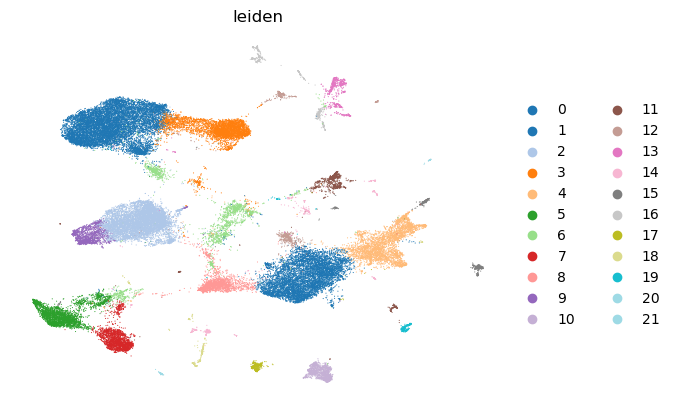

In [29]:
##### umap
sc.pl.embedding(adata, basis="X_umap", color=["leiden"], ncols=1,frameon=False, palette="tab20")

D:\Sublime Text 3\anaconda\Lib\site-packages\umap\umap_.py:1394: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


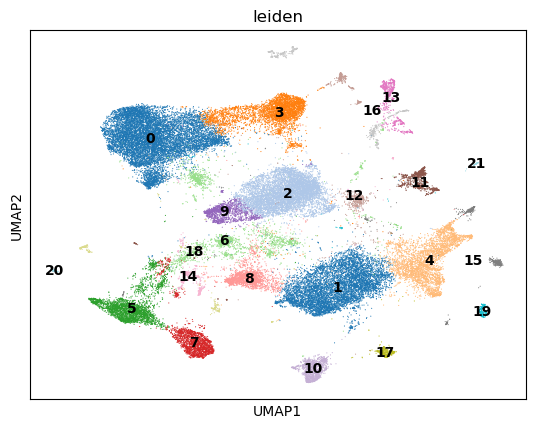

In [32]:
sc.tl.umap(adata, min_dist=0.02, spread=5.0)  # maximal separation
sc.pl.umap(adata, color="leiden", legend_loc="on data")


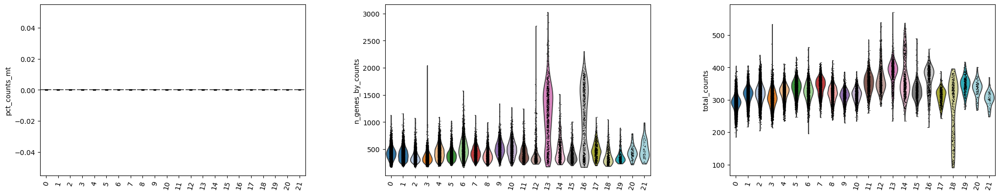

Mitochondrial genes detected: 0


In [62]:
#####qc plot
# Convert to lowercase and check for prefix
adata.var["mt"] = adata.var_names.str.lower().str.startswith("mt-")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)
sc.pl.violin(
    adata,
    keys=["pct_counts_mt", "n_genes_by_counts", "total_counts"],
    groupby="leiden",
    rotation=75,
    save="QC.png",
    multi_panel=True
)

print("Mitochondrial genes detected:", adata.var["mt"].sum())


In [36]:
adata.var

,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,symbol,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,mt-
highly_variable,,,,,,,,,,,,
True,0.219286,0.786067,1.262223,3,True,Xkr4,False,8034,0.133360,83.781820,6606.257347,False
True,0.021249,0.283508,0.419160,3,True,Gm1992,False,1170,0.014182,97.638129,702.547236,False
True,0.001202,0.187390,0.308321,2,False,Gm37381,False,66,0.000852,99.866766,42.215479,False
True,0.013633,0.403764,0.697488,3,True,Rp1,False,616,0.008730,98.756485,432.441480,False
True,0.026936,0.527651,0.957286,3,True,Sox17,False,1066,0.017127,97.848073,848.421605,False
...,...,...,...,...,...,...,...,...,...,...,...,...
True,0.006831,0.234544,0.359669,2,False,mt-Nd6,False,385,0.004321,99.222803,214.073264,False
True,0.273941,1.123094,1.574917,3,True,mt-Cytb,False,7304,0.156416,85.255466,7748.395703,False
True,0.000164,0.277015,0.547408,2,False,ENSMUSG00000079800,False,8,0.000123,99.983850,6.105275,False


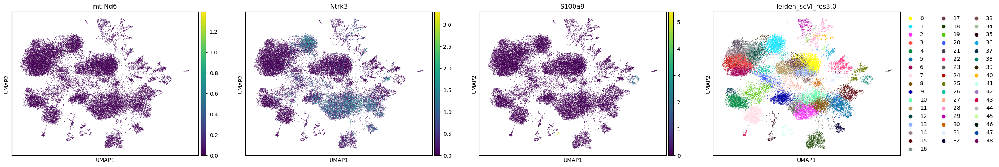

In [56]:
sc.pl.umap(adata, color=[ "mt-Nd6", "Ntrk3", "S100a9", "leiden_scVI_res3.0"])

In [64]:
adata.obs["pct_counts_mt"].describe()


count    49537.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: pct_counts_mt, dtype: float64

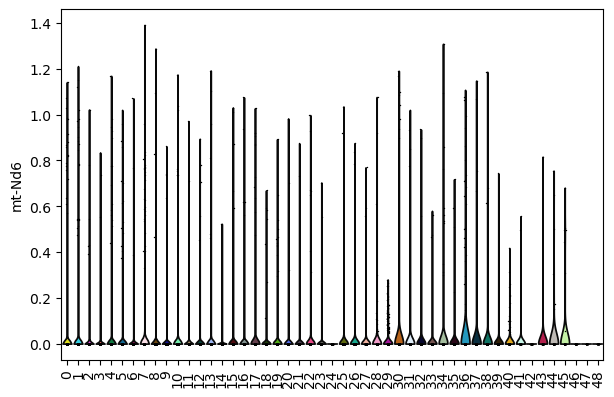

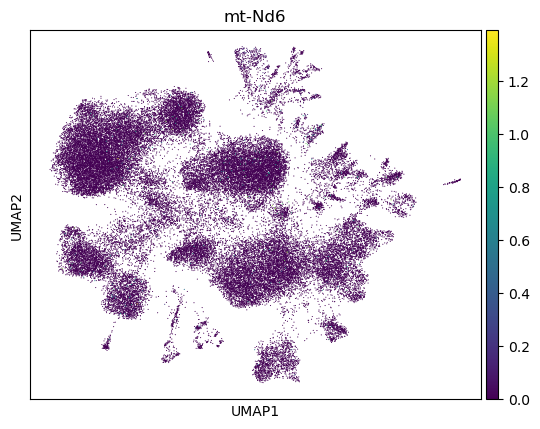

In [68]:
import matplotlib.pyplot as plt

# Violin plot
sc.pl.violin(adata, keys="mt-Nd6", groupby="leiden_scVI_res3.0", rotation=90)

# OR Feature plot (UMAP)
sc.pl.umap(adata, color="mt-Nd6")


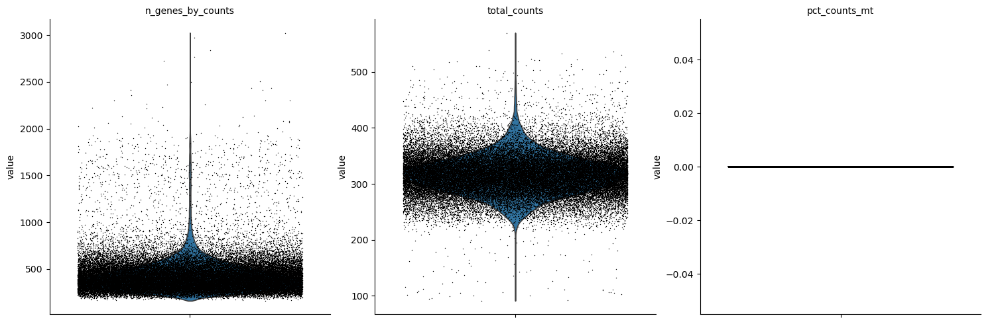

In [70]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)